In [1]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import numpy as np
import cv2
from matplotlib import colors
from keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
import keras
import tensorflow as tf
from mpl_toolkits.axes_grid1 import ImageGrid

In [2]:
df_train = pd.read_csv("C:/Users/Hp/Desktop/Cassava Leaf Disease Detection/Dataset/train.csv")

In [3]:
df_train

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
...,...,...
21392,999068805.jpg,3
21393,999329392.jpg,3
21394,999474432.jpg,1
21395,999616605.jpg,4


In [4]:
f = open("C:/Users/Hp/Desktop/Cassava Leaf Disease Detection/Dataset/label_num_to_disease_map.json")
label_name = json.load(f)
label_name

{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [5]:
path_org = 'C:/Users/Hp/Desktop/Cassava Leaf Disease Detection/Dataset/train_images/'
path_img = df_train['image_id']
df_train['path'] = path_org + df_train['image_id']
df_train.head()

,image_id,label,path
0,1000015157.jpg,0,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...
1,1000201771.jpg,3,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...
2,100042118.jpg,1,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...
3,1000723321.jpg,1,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...
4,1000812911.jpg,3,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...


In [6]:
def get_image(path):
  path_org = 'C:/Users/Hp/Desktop/Cassava Leaf Disease Detection/Dataset/train_images/'
  img = mpimg.imread(path_org + path)
  return img

In [7]:
def plot_class_image(disease_class):
  df_0 = df_train[df_train['label'] == disease_class]
  fig, axes = plt.subplots(2, 2, figsize = (10, 8))
  image_0 = list(df_0['image_id'])
  idx = 0
  for row in range(2):
    for col in range(2):
      path_tmp = image_0[idx]
      axes[row, col].imshow(get_image(path_tmp))
      idx += 1
      axes[row, col].axis('off') 
  fig.tight_layout()  

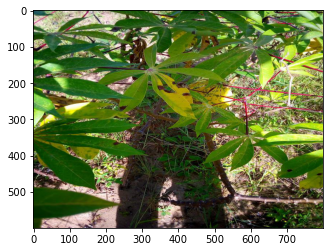

In [8]:
img_tmp = df_train['image_id'][0]
img1 = get_image(img_tmp)
plt.imshow(img1)

In [9]:
df_train.shape

(21397, 3)

In [10]:
print(df_train.isnull().sum(axis = 0))

image_id    0
label       0
path        0
dtype: int64


In [11]:
print(df_train.label.value_counts())

3    13158
4     2577
2     2386
1     2189
0     1087
Name: label, dtype: int64


In [12]:
label_name = {int(k):v for k, v in label_name.items()}

In [13]:
df_cnt = df_train['label'].value_counts()
df_cnt.index.astype('str')
df_cnt = df_cnt.rename(index = label_name)
df_cnt

Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Cassava Green Mottle (CGM)              2386
Cassava Brown Streak Disease (CBSD)     2189
Cassava Bacterial Blight (CBB)          1087
Name: label, dtype: int64

F:\suchith\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


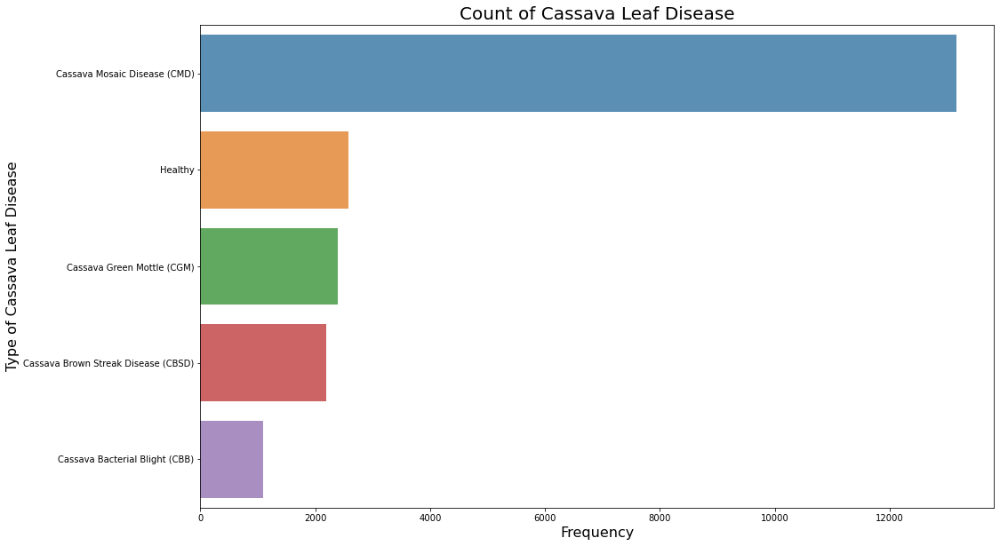

In [14]:
plt.figure(figsize=(16,10))
sns.barplot(df_cnt.values, df_cnt.index, alpha=0.8, orient = "h")
plt.ylabel('Type of Cassava Leaf Disease', fontsize = 16)
plt.xlabel('Frequency', fontsize = 16)
plt.title("Count of Cassava Leaf Disease", fontsize = 20)
plt.show()

In [15]:
df_train['label_name'] = df_train['label'].map(label_name)
df_train.head()

,image_id,label,path,label_name
0,1000015157.jpg,0,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,C:/Users/Hp/Desktop/Cassava Leaf Disease Detec...,Cassava Mosaic Disease (CMD)


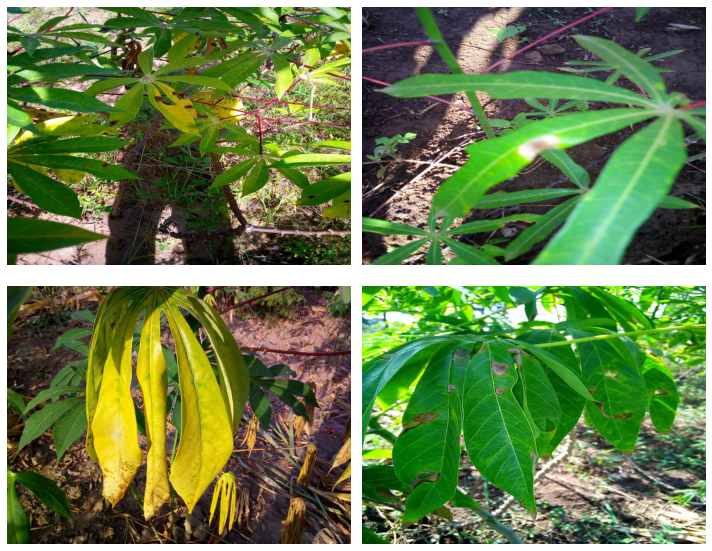

In [16]:
plot_class_image(0)

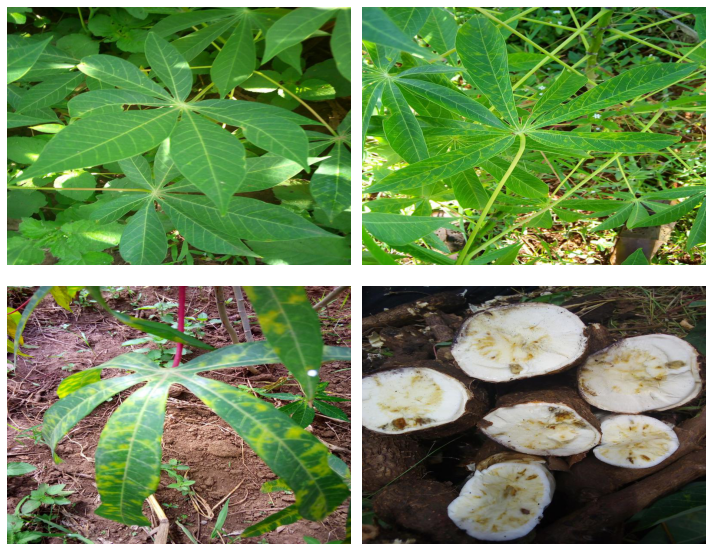

In [17]:
plot_class_image(1)

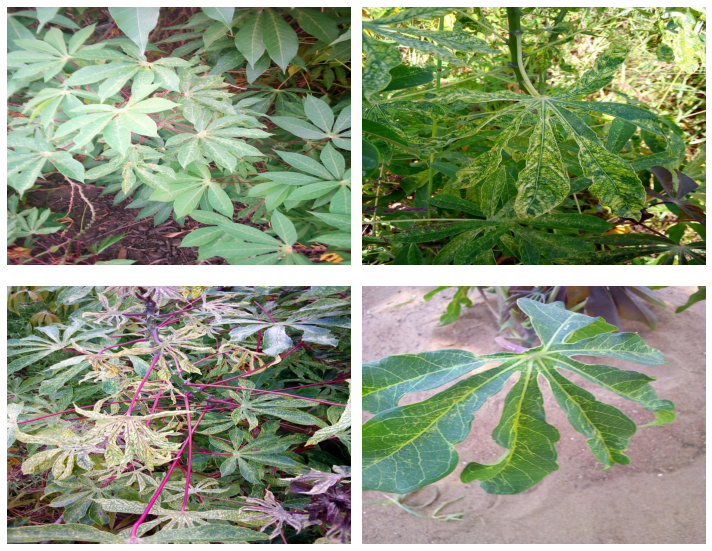

In [18]:
plot_class_image(2)

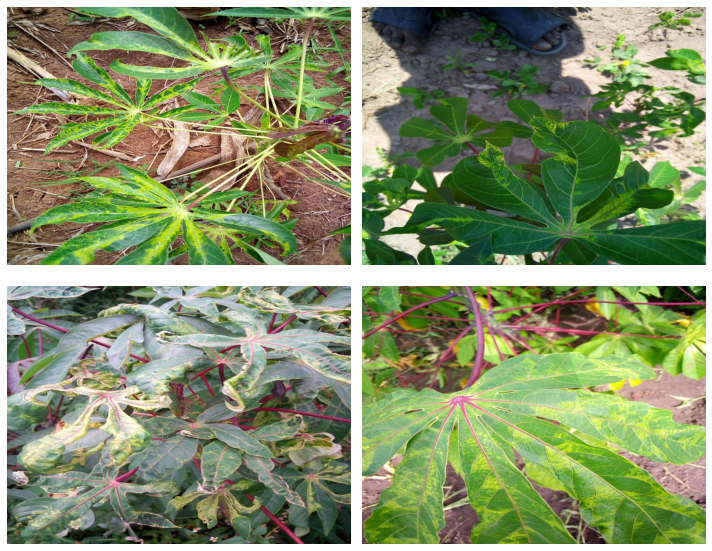

In [19]:
plot_class_image(3)

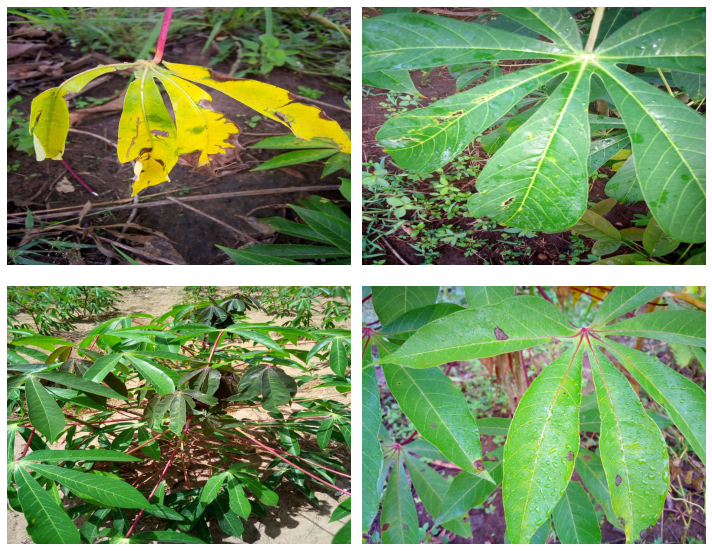

In [20]:
plot_class_image(4)

array([[[ 68,  56,  92],
        [ 79,  67, 103],
        [ 95,  81, 116],
        ...,
        [ 99,  88,  96],
        [ 98,  85,  94],
        [ 96,  83,  92]],

       [[ 53,  41,  77],
        [ 64,  50,  85],
        [ 82,  68, 101],
        ...,
        [ 78,  65,  74],
        [ 82,  69,  78],
        [ 86,  70,  80]],

       [[ 70,  56,  91],
        [ 73,  59,  94],
        [ 92,  77, 110],
        ...,
        [ 66,  51,  58],
        [ 71,  56,  63],
        [ 74,  57,  67]],

       ...,

       [[ 12,  25,  78],
        [ 12,  25,  78],
        [ 13,  26,  81],
        ...,
        [139, 111, 126],
        [133, 105, 120],
        [119,  88, 104]],

       [[ 12,  25,  78],
        [ 13,  26,  79],
        [ 13,  26,  81],
        ...,
        [137, 109, 124],
        [132, 104, 119],
        [127,  96, 112]],

       [[ 14,  25,  79],
        [ 14,  25,  79],
        [ 14,  25,  81],
        ...,
        [132, 104, 118],
        [127,  99, 113],
        [134, 103, 118]]

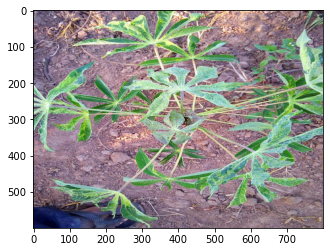

In [21]:
img_tmp = df_train['image_id'][16]
img_rgb = get_image(img_tmp)
plt.imshow(img_rgb)
img_rgb

In [22]:
print('Image Type: ',type(img_rgb))
print('Image Hight: ',img_rgb.shape[0])
print('Image Width: ',img_rgb.shape[1])
print('Image Dimension:', img_rgb.ndim)
print()
print("RGB Information:")
print('The maximum RGB value in this image {}'.format(img_rgb.max()))
print('The minimum RGB value in this image {}'.format(img_rgb.min()))

print('Value of only R channel {}'.format(img_rgb[ 300, 200, 0]))
print('Value of only G channel {}'.format(img_rgb[ 300, 200, 1]))
print('Value of only B channel {}'.format(img_rgb[ 300, 200, 2]))

Image Type:  <class 'numpy.ndarray'>
Image Hight:  600
Image Width:  800
Image Dimension: 3

RGB Information:
The maximum RGB value in this image 255
The minimum RGB value in this image 0
Value of only R channel 130
Value of only G channel 160
Value of only B channel 148


[[ 68  79  95 ...  99  98  96]
 [ 53  64  82 ...  78  82  86]
 [ 70  73  92 ...  66  71  74]
 ...
 [ 12  12  13 ... 139 133 119]
 [ 12  13  13 ... 137 132 127]
 [ 14  14  14 ... 132 127 134]]
(600, 800)


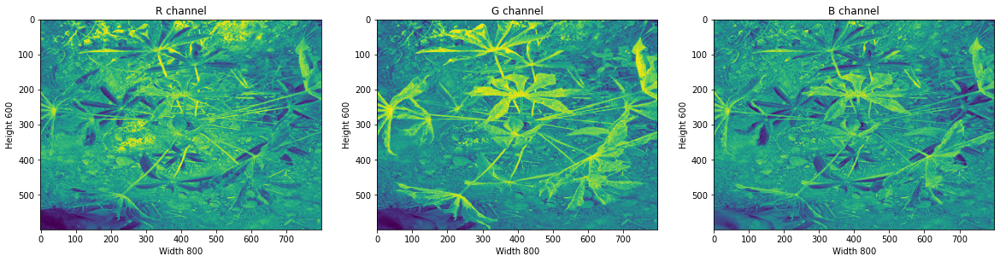

In [23]:
fig, ax = plt.subplots(1, 3, figsize=(20,20))

ax[0].set_title('R channel')
ax[0].set_ylabel('Height {}'.format(img_rgb.shape[0]))
ax[0].set_xlabel('Width {}'.format(img_rgb.shape[1]))
ax[0].imshow(img_rgb[ : , : ,0])
print(img_rgb[: , : , 0])
print(img_rgb[ : , : , 0].shape)
ax[1].set_title('G channel')
ax[1].set_ylabel('Height {}'.format(img_rgb.shape[0]))
ax[1].set_xlabel('Width {}'.format(img_rgb.shape[1]))
ax[1].imshow(img_rgb[ : , : , 1])

ax[2].set_title('B channel')
ax[2].set_ylabel('Height {}'.format(img_rgb.shape[0]))
ax[2].set_xlabel('Width {}'.format(img_rgb.shape[1]))
ax[2].imshow(img_rgb[ : , : , 2])
plt.show()

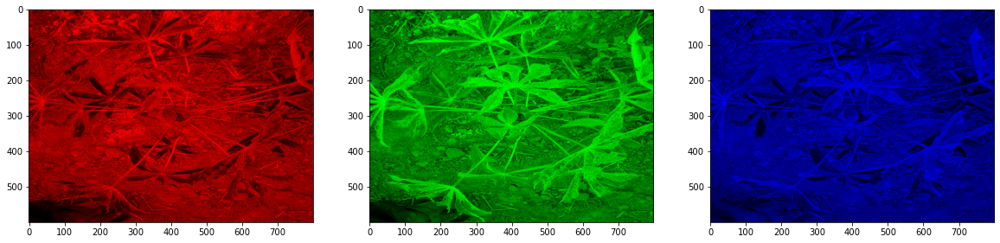

In [24]:
fig, ax = plt.subplots(nrows = 1, ncols=3, figsize=(20,20))  
for i, ax in zip(range(3), ax):     
     split_img = np.zeros(img_rgb.shape, dtype="uint8")
     split_img[ :, :, i] = img_rgb[ :, :, i]
     ax.imshow(split_img)

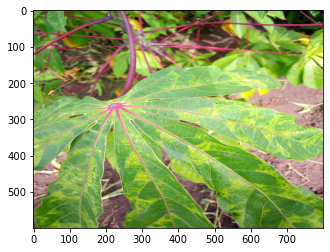

In [25]:
img_tmp = df_train['image_id'][9]
img_3d = get_image(img_tmp)
plt.imshow(img_3d)

[[102  85  78]
 [106  94  80]
 [113 112  81]
 ...
 [129 165  65]
 [130 166  66]
 [131 167  67]]


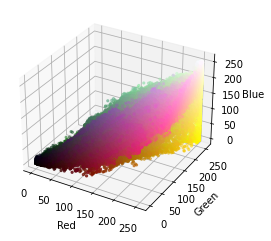

In [26]:
r, g, b = cv2.split(img_3d)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
pixel_colors = img_3d.reshape((np.shape(img_3d)[0]*np.shape(img_3d)[1], 3))
print(pixel_colors)
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()

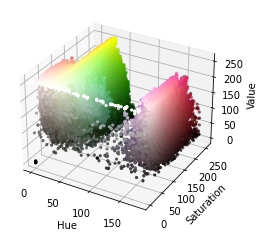

In [27]:
hsv_3d = cv2.cvtColor(img_3d, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv_3d)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

In [28]:
data_generator_rotation = ImageDataGenerator(rotation_range=30, fill_mode='nearest')

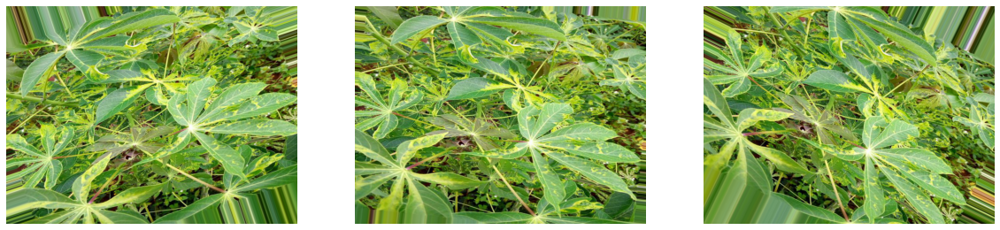

In [29]:
img_aug = df_train['image_id'][10]
img_aug = get_image(img_aug)
x = img_to_array(img_aug) 
x = x.reshape((1,) + x.shape) 
aug_iterator = data_generator_rotation.flow(x, batch_size=1)
fig, ax = plt.subplots(1, 3, figsize=(20,20))
for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  

In [30]:
data_generator_shift = ImageDataGenerator(
    width_shift_range=0.3, 
    height_shift_range=0.3,
    fill_mode='nearest')

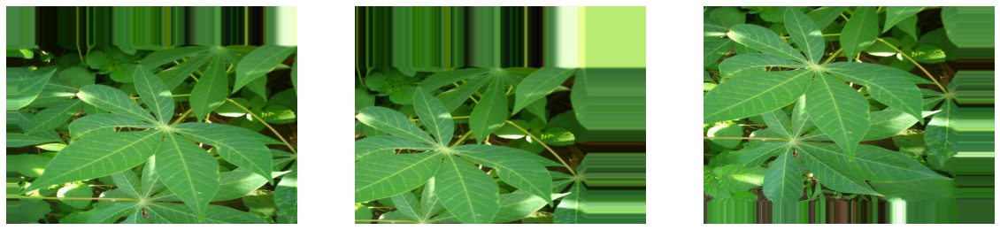

In [31]:
img_aug_1 = df_train['image_id'][2]
img_aug_1 = get_image(img_aug_1)
x = img_to_array(img_aug_1) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator_shift.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 3, figsize=(20,20))

for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  

In [32]:
data_generator_flip = ImageDataGenerator(
    horizontal_flip=True, 
    vertical_flip=True,
    fill_mode='nearest')

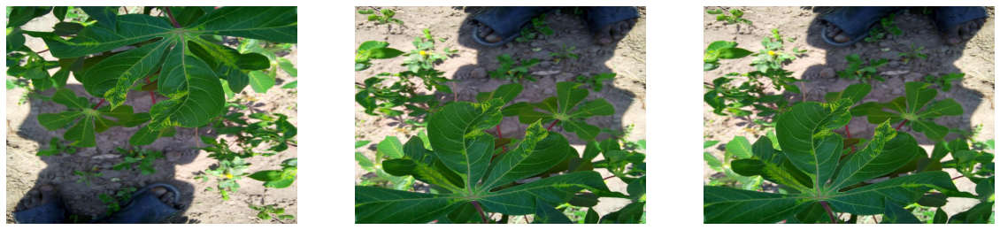

In [33]:
img_aug_2 = df_train['image_id'][4]
img_aug_2 = get_image(img_aug_2)
x = img_to_array(img_aug_2) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator_flip.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 3, figsize=(20,20))

for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  

In [34]:
data_generator_bright = ImageDataGenerator(
    brightness_range=[0.2,2.0],
    fill_mode='nearest')

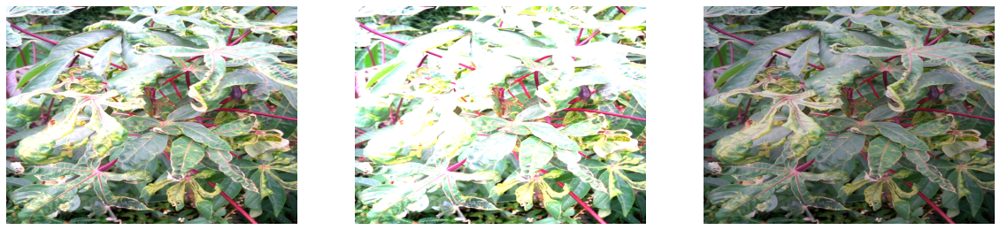

In [35]:
img_aug_2 = df_train['image_id'][5]
img_aug_2 = get_image(img_aug_2)
x = img_to_array(img_aug_2) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator_bright.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 3, figsize=(20,20))

for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  

In [36]:
data_generator_zoom = ImageDataGenerator(
    zoom_range=0.5)

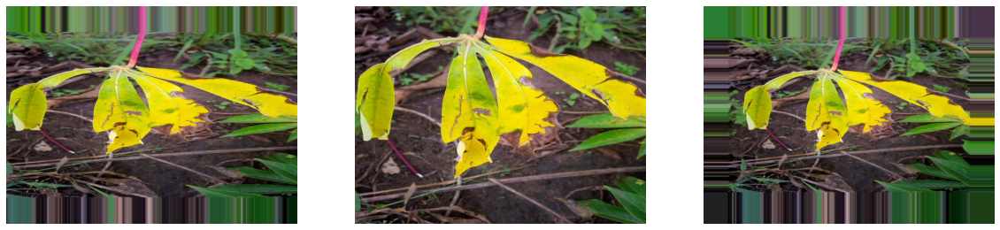

In [37]:
img_aug_2 = df_train['image_id'][8]
img_aug_2 = get_image(img_aug_2)
x = img_to_array(img_aug_2) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator_zoom.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 3, figsize=(20,20))

for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off') 

In [38]:
data_generator_shear = ImageDataGenerator(
    shear_range=40)

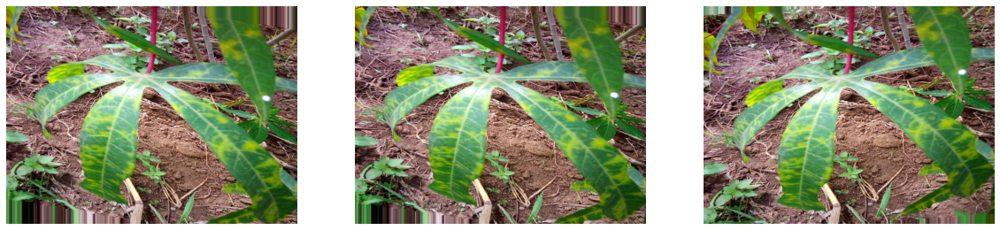

In [39]:
img_aug_2 = df_train['image_id'][12]
img_aug_2 = get_image(img_aug_2)
x = img_to_array(img_aug_2) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator_shear.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 3, figsize=(20,20))

for i in range(3):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  

In [40]:
data_generator = ImageDataGenerator(
    width_shift_range=0.3, 
    height_shift_range=0.3,
    horizontal_flip=True, 
    vertical_flip=True,
    brightness_range=[0.5,1.5],
    zoom_range=0.5,
    shear_range=20,
    fill_mode='nearest')

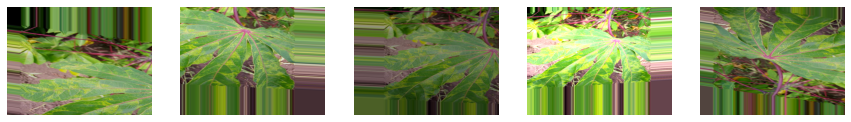

In [41]:
img_aug_2 = df_train['image_id'][9]
img_aug_2 = get_image(img_aug_2)
x = img_to_array(img_aug_2) 
x = x.reshape((1,) + x.shape) 

aug_iterator = data_generator.flow(x, batch_size=1)

fig, ax = plt.subplots(1, 5, figsize=(15,15))

for i in range(5):
    image = next(aug_iterator)[0].astype('uint8')
    ax[i].imshow(image)
    ax[i].axis('off')  